# Clase 09: Visualización de Mapas

Por **Daniela Opitz**. <dopitz@udd.cl>.

Actualizado: **21 de mayo de 2024**.

En este notebook trabajaremos con información geográfica. Seguiremos estudiando el data set de viajes de la encuesta origen-destino, esta vez enfocándonos en distintos patrones geográficos que puedan ayudarnos a responder preguntas específicas.


## Preámbulo y Carga de Datos

Primero chequeamos que tenemos todos los requisitos para usar las bibliotecas

Y descargar los datos si es que estás usando Google Colab

try:
    import google.colab
    !curl -L -o data.zip 'https://www.dropbox.com/s/6rqkx8wtwa0fc36/data.zip?dl=1'
    !unzip -o data.zip
except:
    pass

In [1]:
try:
    import google.colab
    !curl -L -o Fira_Sans_Extra_Condensed.zip 'https://www.dropbox.com/s/82nuhtpybfpjeq9/Fira_Sans_Extra_Condensed.zip?dl=1'
    !unzip -o Fira_Sans_Extra_Condensed.zip
    import matplotlib as mpl
    mpl.font_manager.fontManager.addfont('Fira_Sans_Extra_Condensed/FiraSansExtraCondensed-Regular.ttf')
    #mpl.rc('font', family='Fira Sans Extra Condensed')
except:
    pass

In [6]:
# !pip3 install KDEpy
!pip3 install contextily

In [7]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import geopandas as gpd

# esto configura la calidad de la imagen. dependerá de tu resolución. el valor por omisión es 80
mpl.rcParams["figure.dpi"] = 96
# esto depende de las fuentes que tengas instaladas en tu sistema.
mpl.rcParams["font.family"] = "Fira Sans Extra Condensed"
%config InlineBackend.figure_format = 'retina'

from google.colab import drive
drive.mount('/content/drive')

In [8]:
# Recarga modulos locales de Python cada vez que se modifican
%load_ext autoreload
%autoreload 2
from miniaves import figure_from_geodataframe, GeoFacetGrid, bubble_map, heat_map, dot_map, figure_grid_from_geodataframe

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [9]:
viajes_persona=pd.read_csv('https://github.com/daniopitz/visualizacion/raw/main/clases_practicas/data/external/eod_stgo/output/viajes_persona_hogar.csv', sep=',')
viajes_persona

,Hogar,Persona,Viaje,Etapas,ComunaOrigen,ComunaDestino,SectorOrigen,SectorDestino,ZonaOrigen,ZonaDestino,...,NumVeh,NumBicAdulto,NumBicNino,Propiedad,MontoDiv,ImputadoDiv,MontoArr,ImputadoArr,IngresoHogar,FactorHogar
0,173431,17343102,1734310202,1,94.0,94.0,2.0,2.0,400,407,...,0,0,0,2,81067.0,1,120000,0,789356,76.810280
1,173431,17343102,1734310201,1,94.0,94.0,2.0,2.0,407,400,...,0,0,0,2,81067.0,1,120000,0,789356,76.810280
2,173431,17343101,1734310101,2,94.0,328.0,2.0,2.0,407,126,...,0,0,0,2,81067.0,1,120000,0,789356,76.810280
3,173431,17343101,1734310102,1,328.0,70.0,2.0,4.0,126,15,...,0,0,0,2,81067.0,1,120000,0,789356,76.810280
4,173431,17343101,1734310103,2,70.0,94.0,4.0,2.0,15,407,...,0,0,0,2,81067.0,1,120000,0,789356,76.810280
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
100329,743813,74381301,7438130102,1,97.0,97.0,5.0,5.0,235,244,...,0,0,0,1,NaN,0,80000,0,318005,68.410446
100330,743813,74381302,7438130201,1,97.0,97.0,5.0,5.0,244,235,...,0,0,0,1,NaN,0,80000,0,318005,68.410446
100331,743813,74381302,7438130202,1,97.0,97.0,5.0,5.0,235,244,...,0,0,0,1,NaN,0,80000,0,318005,68.410446
100332,743823,74382301,7438230101,1,97.0,97.0,5.0,5.0,235,235,...,0,1,0,1,NaN,0,80000,0,140007,231.671707


In [10]:
viajes_persona["PesoLaboral"] = (
    viajes_persona["FactorLaboralNormal"] * viajes_persona["FactorPersona"]
)

In [11]:
viajes_persona = viajes_persona[pd.notnull(viajes_persona["PesoLaboral"])]

In [12]:
viajes_persona.shape

(65591, 97)

In [13]:
print(
    "{} viajes expandidos a {}".format(
        len(viajes_persona), int(viajes_persona["PesoLaboral"].sum())
    )
)

65591 viajes expandidos a 9669230


## ¿Dónde se concentran las personas que utilizan cada modo de transporte en la ciudad?

Es de interés saber dónde viven las personas que utilizan cada modo de transporte. Eso permite informar la planificación de nuevas redes de transporte y la gestión de las redes actuales.

Esta pregunta tiene una componente geográfica: el _dónde_. Si tuviésemos un enfoque de _tablas_, podríamos utilizar el atributo `Comuna` o `Sector` y resolver tareas del tipo parte-de-un-todo para conocer la distribución del uso de modo de transporte a través de las comunas o sectores.

Sin embargo, existe variabilidad dentro de les habitantes de cada comuna. Además, también es de interés saber si dos comunas/sectores/barrios/etc. cercanos tienen comportamiento similar, y si no, entender el contexto urbano que causa la diferencia.

Ante esa necesidad, un mapa es inmejorable. Pero, ¿cómo construir y configurar el mapa? Exploremos eso ahora.

Primero, veamos cómo luces las coordenadas que vienen dentro de los datos:

In [14]:
viajes_persona[
    ["OrigenCoordX", "OrigenCoordY", "DestinoCoordX", "DestinoCoordY"]
].head()


,OrigenCoordX,OrigenCoordY,DestinoCoordX,DestinoCoordY
0,335208.7188,6288387.0,338812.3125,6292391.0
1,338812.2813,6292391.0,335208.7188,6288387.0
2,338812.2813,6292391.0,343526.5938,6297299.0
3,343526.5938,6297299.0,345015.9063,6297331.0
4,345015.9063,6297331.0,338812.3125,6292391.0


Si bien las coordenadas están en formato numérico, no las tenemos estructuradas en un `GeoDataFrame`. Para ello, usaremos la función `to_point_geodataframe` para darle contexto geográfico a los datos.  Crearemos dos estructuras, una para los orígenes de los viajes y otra para los destinos. Del notebook anterior ya conocemos el sistema de coordenadas:

In [15]:
# Crear geometrías de puntos para origen y destino
origenes_viajes  = gpd.GeoDataFrame(viajes_persona, geometry=gpd.points_from_xy(viajes_persona.OrigenCoordX, viajes_persona.OrigenCoordY), crs="EPSG:32719")
destinos_viajes = gpd.GeoDataFrame(viajes_persona, geometry=gpd.points_from_xy(viajes_persona.DestinoCoordX, viajes_persona.DestinoCoordY), crs="EPSG:32719")


In [16]:
origenes_viajes.head()

,Hogar,Persona,Viaje,Etapas,ComunaOrigen,ComunaDestino,SectorOrigen,SectorDestino,ZonaOrigen,ZonaDestino,...,NumBicNino,Propiedad,MontoDiv,ImputadoDiv,MontoArr,ImputadoArr,IngresoHogar,FactorHogar,PesoLaboral,geometry
0,173431,17343102,1734310202,1,94.0,94.0,2.0,2.0,400,407,...,0,2,81067.0,1,120000,0,789356,76.81028,53.391740,POINT (335208.719 6288387.000)
1,173431,17343102,1734310201,1,94.0,94.0,2.0,2.0,407,400,...,0,2,81067.0,1,120000,0,789356,76.81028,53.391740,POINT (338812.281 6292391.000)
2,173431,17343101,1734310101,2,94.0,328.0,2.0,2.0,407,126,...,0,2,81067.0,1,120000,0,789356,76.81028,37.886589,POINT (338812.281 6292391.000)
3,173431,17343101,1734310102,1,328.0,70.0,2.0,4.0,126,15,...,0,2,81067.0,1,120000,0,789356,76.81028,52.214368,POINT (343526.594 6297299.000)
4,173431,17343101,1734310103,2,70.0,94.0,4.0,2.0,15,407,...,0,2,81067.0,1,120000,0,789356,76.81028,52.214368,POINT (345015.906 6297331.000)


In [17]:
destinos_viajes.head()

,Hogar,Persona,Viaje,Etapas,ComunaOrigen,ComunaDestino,SectorOrigen,SectorDestino,ZonaOrigen,ZonaDestino,...,NumBicNino,Propiedad,MontoDiv,ImputadoDiv,MontoArr,ImputadoArr,IngresoHogar,FactorHogar,PesoLaboral,geometry
0,173431,17343102,1734310202,1,94.0,94.0,2.0,2.0,400,407,...,0,2,81067.0,1,120000,0,789356,76.81028,53.391740,POINT (338812.312 6292391.000)
1,173431,17343102,1734310201,1,94.0,94.0,2.0,2.0,407,400,...,0,2,81067.0,1,120000,0,789356,76.81028,53.391740,POINT (335208.719 6288387.000)
2,173431,17343101,1734310101,2,94.0,328.0,2.0,2.0,407,126,...,0,2,81067.0,1,120000,0,789356,76.81028,37.886589,POINT (343526.594 6297299.000)
3,173431,17343101,1734310102,1,328.0,70.0,2.0,4.0,126,15,...,0,2,81067.0,1,120000,0,789356,76.81028,52.214368,POINT (345015.906 6297331.000)
4,173431,17343101,1734310103,2,70.0,94.0,4.0,2.0,15,407,...,0,2,81067.0,1,120000,0,789356,76.81028,52.214368,POINT (338812.312 6292391.000)


Cargamos el archivo GeoJSON que creamos en el notebook `clase05_mapas_preambulo.ipynb`:

In [18]:
zones= gpd.read_file("https://github.com/daniopitz/visualizacion/raw/main/clases_practicas/data/processed/scl_zonas_urbanas.json")
zones

,ID,AREA,Zona,Com,Comuna,REGION,NOM_REGION,PROVINCIA,NOM_PROVIN,NOM_COMUNA,URBANO,TIPO,NOM_CATEG,SHAPE_Leng,SHAPE_Area,area_m2,geometry
0,103,837.7500,103.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,4.575649e+05,"POLYGON ((-70.65492 -33.55500, -70.65517 -33.5..."
1,104,998.8125,104.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,7.725462e+05,"POLYGON ((-70.67599 -33.55542, -70.67452 -33.5..."
2,106,286.2500,106.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,2.693838e+06,"POLYGON ((-70.69714 -33.56361, -70.69714 -33.5..."
3,115,857.4375,115.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,7.534193e+05,"POLYGON ((-70.67625 -33.55513, -70.67653 -33.5..."
4,116,853.9375,116.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,7.184305e+05,"POLYGON ((-70.66564 -33.55260, -70.66309 -33.5..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
861,364,678.7500,364.0,13118,Macul,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MACUL,MACUL,CAPITAL COMUNAL,CIUDAD,0.150721,0.001246,6.572471e+05,"POLYGON ((-70.59655 -33.47354, -70.59497 -33.4..."
862,369,793.2500,369.0,13118,Macul,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MACUL,MACUL,CAPITAL COMUNAL,CIUDAD,0.150721,0.001246,6.393742e+05,"POLYGON ((-70.59590 -33.48557, -70.59681 -33.4..."
863,365,471.6875,365.0,13118,Macul,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MACUL,MACUL,CAPITAL COMUNAL,CIUDAD,0.150721,0.001246,9.368650e+05,"POLYGON ((-70.60427 -33.47400, -70.60126 -33.4..."
864,734,864.0000,734.0,13301,Colina,13,REGIÓN METROPOLITANA DE SANTIAGO,133,CHACABUCO,COLINA,LO ARCAYA - CASAS VIEJAS,URBANO,PUEBLO,0.049422,0.000034,3.481754e+05,"POLYGON ((-70.67810 -33.24491, -70.67854 -33.2..."


<Axes: >

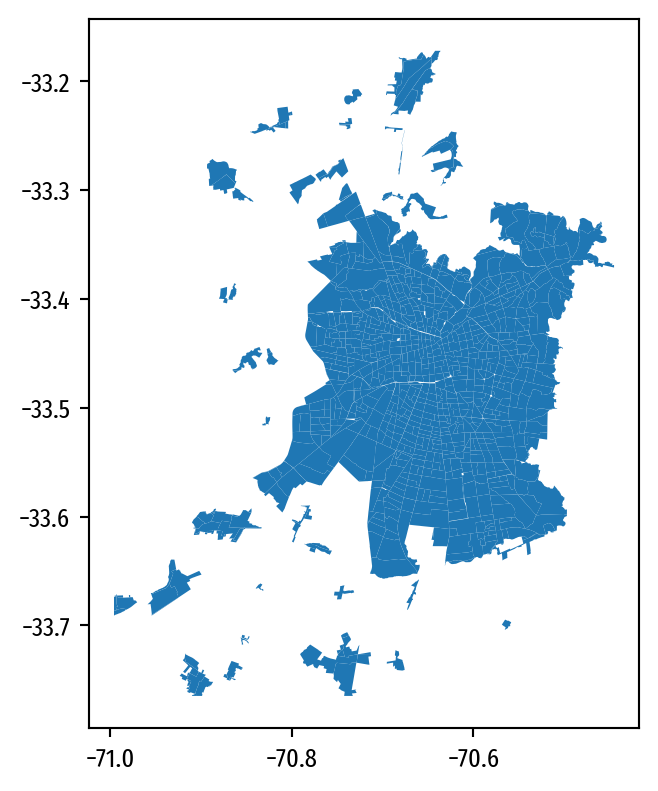

In [19]:
zones.plot()

In [20]:
zones = (
    gpd.read_file("https://github.com/daniopitz/visualizacion/raw/main/clases_practicas/data/processed/scl_zonas_urbanas.json")
    .set_index("ID")
    .to_crs(origenes_viajes.crs)
)
zones.head()


,AREA,Zona,Com,Comuna,REGION,NOM_REGION,PROVINCIA,NOM_PROVIN,NOM_COMUNA,URBANO,TIPO,NOM_CATEG,SHAPE_Leng,SHAPE_Area,area_m2,geometry
ID,,,,,,,,,,,,,,,,
103,837.7500,103.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,4.575649e+05,"POLYGON ((346371.218 6285956.953, 346349.534 6..."
104,998.8125,104.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,7.725462e+05,"POLYGON ((344415.434 6285878.048, 344548.462 6..."
106,286.2500,106.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,2.693838e+06,"POLYGON ((342466.924 6284938.448, 342467.002 6..."
115,857.4375,115.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,7.534193e+05,"POLYGON ((344391.421 6285910.048, 344365.314 6..."
116,853.9375,116.0,13105,El Bosque,13,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,EL BOSQUE,EL BOSQUE,CAPITAL COMUNAL,CIUDAD,0.152123,0.001391,7.184305e+05,"POLYGON ((345371.399 6286207.024, 345608.811 6..."


Ahora nos aseguramos de tener orígenes y destinos que solo se dan dentro del contexto urbano determinado por el `GeoDataFrame` de `zonas`:

In [21]:
# Filtrar orígenes y destinos dentro de las zonas urbanas
origenes_viajes_urban = gpd.sjoin(origenes_viajes, zones, how="inner", predicate="within")
destinos_viajes_urban = gpd.sjoin(destinos_viajes, zones, how="inner", predicate="within")

Grafiquemos los datos. Utilizaremos la función `figure_from_geodataframe` de aves que configura los ejes de manera automática, y el método `plot` de geopandas puede graficar directamente los puntos de origen/destino:

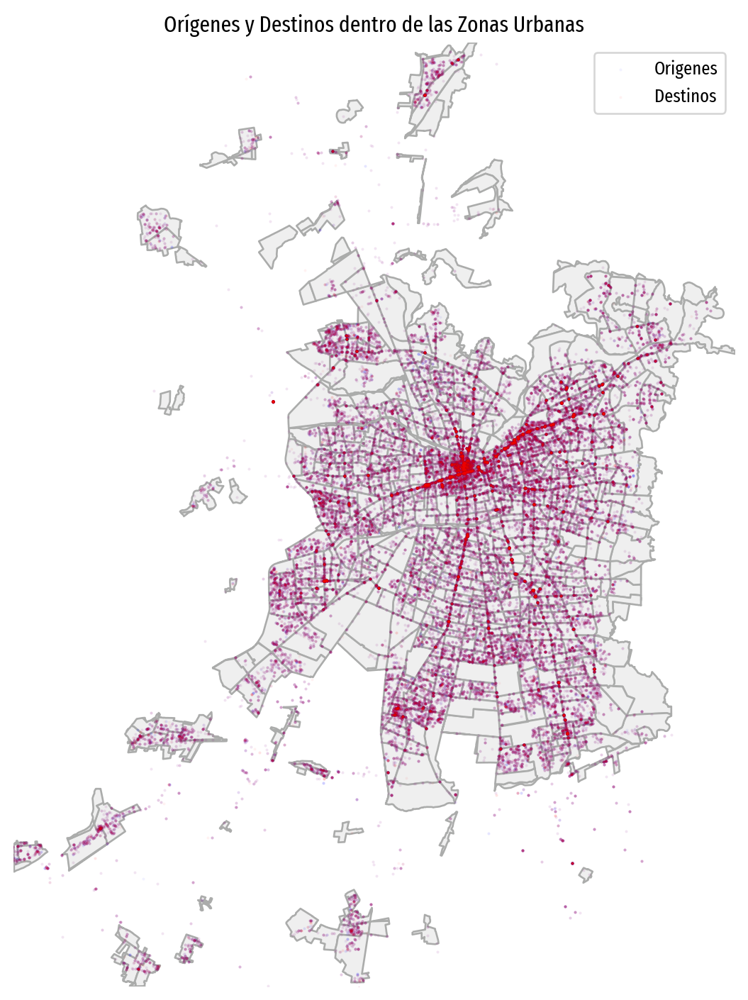

In [22]:
# figure_from_geodataframe retorna un canvas para dibujar los mapas
# height es la altura relativa de la visualizacion con respecto a los datos en
# el geodataframe
fig, ax = figure_from_geodataframe(zones, height=9)

zones.plot(ax=ax, color="#efefef", edgecolor="#abacab", linewidth=1)
origenes_viajes.plot(ax=ax, markersize=1, marker=".", color="blue", alpha=0.05, label="Origenes")
destinos_viajes.plot(ax=ax, markersize=1, marker=".", color="red", alpha=0.05, label="Destinos")

ax.legend(loc='upper right')
ax.set_title('Orígenes y Destinos dentro de las Zonas Urbanas');

Text(0, 0.5, 'Coordenada Y')

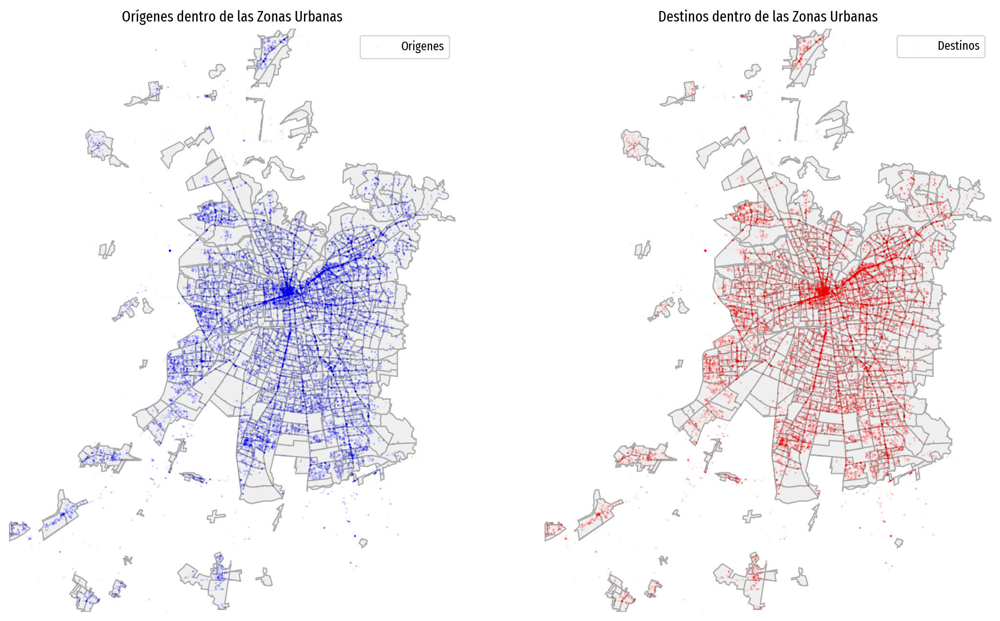

In [23]:
fig, ax = figure_grid_from_geodataframe(zones, ncols=2, height=9)

zones.plot(ax=ax[0], color="#efefef", edgecolor="#abacab", linewidth=1)
origenes_viajes.plot(ax=ax[0], markersize=1, marker=".", color="blue", alpha=0.05, label="Origenes")
zones.plot(ax=ax[1], color="#efefef", edgecolor="#abacab", linewidth=1)
destinos_viajes.plot(ax=ax[1], markersize=1, marker=".", color="red", alpha=0.05, label="Destinos")


# Configurar leyenda y título
ax[0].legend()
ax[0].set_title('Orígenes dentro de las Zonas Urbanas')
ax[0].set_xlabel('Coordenada X')
ax[0].set_ylabel('Coordenada Y')

ax[1].legend()
ax[1].set_title('Destinos dentro de las Zonas Urbanas')
ax[1].set_xlabel('Coordenada X')
ax[1].set_ylabel('Coordenada Y')

Nos damos cuenta que hay muchos datos. Tenemos que:

- **Filtrarlos**, es decir, decidir cuáles son relevantes para la tarea.
- **Visualizarlos** utilizando la técnica adecuada.

Para filtrarlos, fíjemonos en cuatro modos de transporte: público (`Bip!`), privado (`Auto`) y activo (`Caminata` y `Bicicleta`). Y por ahora veamos los viajes al trabajo.
Para visualizarlos, en aves tenemos una función `dot_map` que hace un mapa de puntos y que nos permitirá configurar algunos aspectos del gráfico considerando los aspectos que vimos en la clase teórica.

El gráfico se puede hacer así:

In [24]:
origenes_viajes_urban['ModoDifusion'].value_counts()

ModoDifusion
Bip!                    22047
Auto                    16121
Caminata                 9782
Otros                    5733
Taxi Colectivo           2176
Bicicleta                1831
Bip! - Otros Publico     1576
Taxi                     1061
Bip! - Otros Privado      727
Name: count, dtype: int64

In [25]:
# Filtrar por modos de transporte y propósito del viaje
modos_transporte = ['Bip!', 'Auto', 'Caminata', 'Bicicleta']
viajes_trabajo = origenes_viajes_urban[(origenes_viajes_urban['ModoDifusion'].isin(modos_transporte)) & (origenes_viajes_urban['Proposito'] == 'Al trabajo')]


In [26]:
viajes_trabajo

,Hogar,Persona,Viaje,Etapas,ComunaOrigen,ComunaDestino,SectorOrigen,SectorDestino,ZonaOrigen,ZonaDestino,...,NOM_REGION,PROVINCIA,NOM_PROVIN,NOM_COMUNA,URBANO,TIPO,NOM_CATEG,SHAPE_Leng,SHAPE_Area,area_m2
2,173431,17343101,1734310101,2,94.0,328.0,2.0,2.0,407,126,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MAIPÚ,MAIPÚ,CAPITAL COMUNAL,CIUDAD,0.359284,0.005556,2.381054e+06
5,173441,17344101,1734410101,2,94.0,71.0,2.0,3.0,407,307,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MAIPÚ,MAIPÚ,CAPITAL COMUNAL,CIUDAD,0.359284,0.005556,2.381054e+06
7,173441,17344103,1734410301,2,94.0,91.0,2.0,3.0,407,437,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MAIPÚ,MAIPÚ,CAPITAL COMUNAL,CIUDAD,0.359284,0.005556,2.381054e+06
16,173462,17346201,1734620102,1,94.0,94.0,2.0,2.0,398,398,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MAIPÚ,MAIPÚ,CAPITAL COMUNAL,CIUDAD,0.359284,0.005556,3.688455e+06
29,173481,17348101,1734810101,2,94.0,70.0,2.0,4.0,398,48,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,MAIPÚ,MAIPÚ,CAPITAL COMUNAL,CIUDAD,0.359284,0.005556,3.688455e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99453,328990,32899001,3289900101,1,96.0,96.0,5.0,5.0,185,182,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,LA CISTERNA,LA CISTERNA,CAPITAL COMUNAL,CIUDAD,0.125686,0.000969,5.074571e+05
99455,328990,32899001,3289900103,1,96.0,96.0,5.0,5.0,185,182,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,LA CISTERNA,LA CISTERNA,CAPITAL COMUNAL,CIUDAD,0.125686,0.000969,5.074571e+05
99457,328990,32899002,3289900201,1,96.0,70.0,5.0,4.0,185,48,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,LA CISTERNA,LA CISTERNA,CAPITAL COMUNAL,CIUDAD,0.125686,0.000969,5.074571e+05
99472,329011,32901101,3290110101,1,96.0,337.0,5.0,5.0,187,339,...,REGIÓN METROPOLITANA DE SANTIAGO,131,SANTIAGO,LA CISTERNA,LA CISTERNA,CAPITAL COMUNAL,CIUDAD,0.125686,0.000969,4.040178e+05


Text(0, 0.5, 'Coordenada Y')

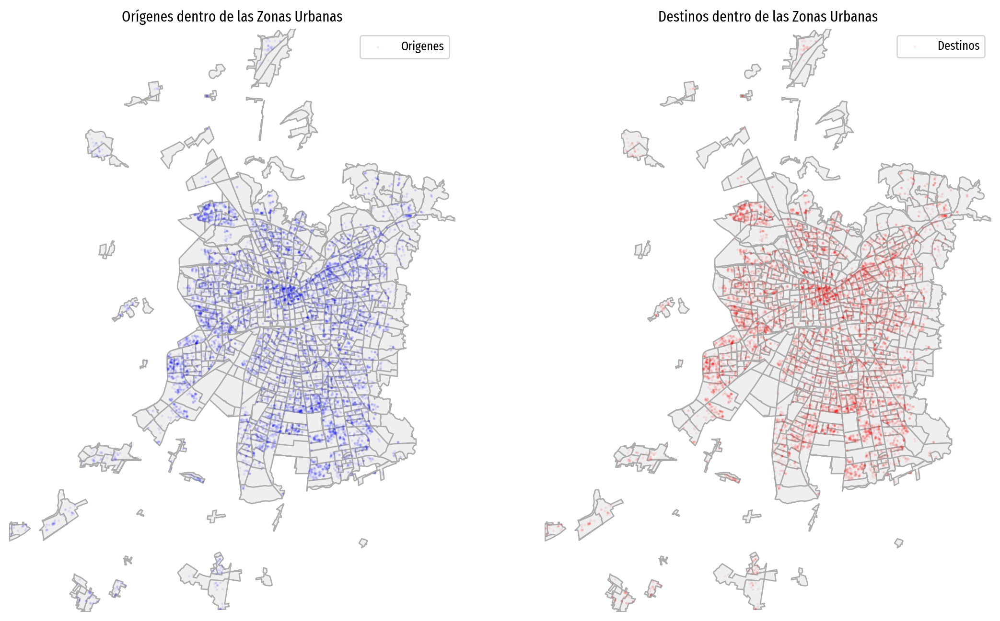

In [27]:
fig, ax = figure_grid_from_geodataframe(zones, ncols=2, height=9)

zones.plot(ax=ax[0], color="#efefef", edgecolor="#abacab", linewidth=1)
viajes_trabajo.plot(ax=ax[0], markersize=5, marker=".", color="blue", alpha=0.05, label="Origenes")
zones.plot(ax=ax[1], color="#efefef", edgecolor="#abacab", linewidth=1)
viajes_trabajo.plot(ax=ax[1], markersize=5, marker=".", color="red", alpha=0.05, label="Destinos")


# Configurar leyenda y título
# Configurar leyenda y título
ax[0].legend()
ax[0].set_title('Orígenes dentro de las Zonas Urbanas')
ax[0].set_xlabel('Coordenada X')
ax[0].set_ylabel('Coordenada Y')

ax[1].legend()
ax[1].set_title('Destinos dentro de las Zonas Urbanas')
ax[1].set_xlabel('Coordenada X')
ax[1].set_ylabel('Coordenada Y')

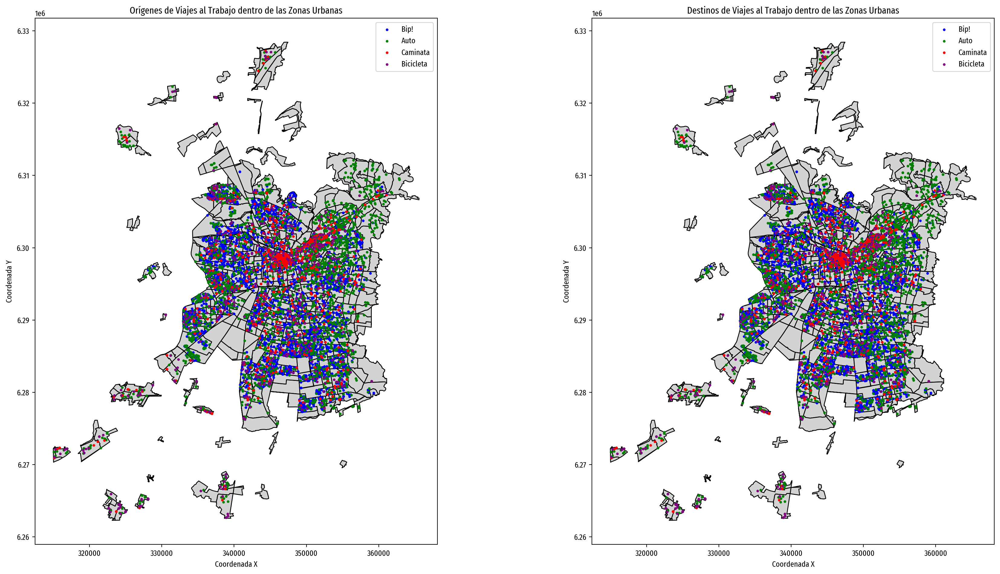

In [28]:
fig, ax = plt.subplots(1, 2, figsize=(20, 10))

modos_colores = {
    'Bip!': 'blue',
    'Auto': 'green',
    'Caminata': 'red',
    'Bicicleta': 'purple'
}

# Graficar las zonas en ambos subplots
zones.plot(ax=ax[0], color='lightgrey', edgecolor='black')
zones.plot(ax=ax[1], color='lightgrey', edgecolor='black')

# Graficar los orígenes con colores según el modo de transporte
for modo, color in modos_colores.items():
    origenes_modo = viajes_trabajo[viajes_trabajo['ModoDifusion'] == modo]
    origenes_modo.plot(ax=ax[0], color=color, markersize=5, label=modo)

# Graficar los destinos con colores según el modo de transporte
for modo, color in modos_colores.items():
    destinos_modo = viajes_trabajo[viajes_trabajo['ModoDifusion'] == modo]
    destinos_modo.plot(ax=ax[1], color=color, markersize=5, label=modo)

# Configurar leyenda y título para los orígenes
ax[0].legend()
ax[0].set_title('Orígenes de Viajes al Trabajo dentro de las Zonas Urbanas')
ax[0].set_xlabel('Coordenada X')
ax[0].set_ylabel('Coordenada Y')

# Configurar leyenda y título para los destinos
ax[1].legend()
ax[1].set_title('Destinos de Viajes al Trabajo dentro de las Zonas Urbanas')
ax[1].set_xlabel('Coordenada X')
ax[1].set_ylabel('Coordenada Y')

plt.tight_layout()
plt.show()


Notamos que cada categoría utiliza un tono de color distinto. Sin embargo, cuesta ver una posible distribución geográfica debido a la oclusión y aglomeramiento de los viajes.

Una posible solución es darle un tamaño a cada punto que sea proporcional al peso de los viajes. En tal caso, en vez de `dot_map` utilizaremos `bubble_map`:

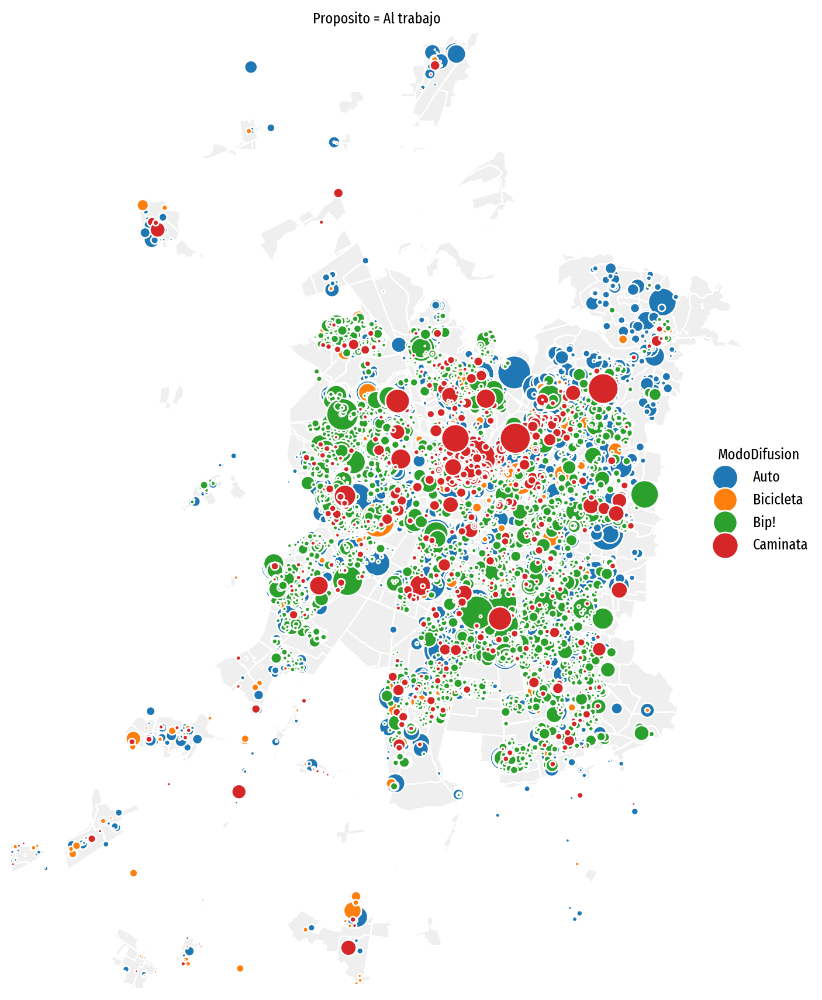

In [32]:

grid = GeoFacetGrid(
    # los datos
    origenes_viajes,
    # el contexto geográfico. es opcional, se utiliza para configurar el gráfico
    context=zones,
    # la variable que mapearemos a las filas del gráfico
    row="Proposito",
    # en este caso, solo una fila
    row_order=["Al trabajo"],
    # el canal de codificación tono (hue) expresará la columna categórica ModoDifusion
    hue="ModoDifusion",
    # solo veremos estas categorías
    hue_order=["Auto", "Bicicleta", "Bip!", "Caminata"],
    # la altura del gráfico
    height=9,
)

# visualizamos el contexto
grid.add_layer(zones, color="#efefef", edgecolor="white", linewidth=1)

# agregamos los bubble_map correspondientes
grid.add_layer(bubble_map, size="PesoLaboral", scale=0.15)

# agregamos la leyenda
grid.add_legend()

grid.fig.tight_layout()


La idea sonaba bien, sin embargo, el gráfico no nos permite responder la pregunta (aunque es un lindo gráfico para compartir y contemplar). Esto se debe a varios factores, incluyendo la interferencia entre los canales utilizados en la codificación.

También la implementación del gráfico es compleja. Requiere ciclos a través de los resultados de una operación `groupby`.

Utilizaremos la grilla `GeoFacetGrid` de aves (inspirada en `FacetGrid` de seaborn) para hacer el mismo gráfico pero utilizando conceptos vistos en clase.

La implementación del gráfico es distinta, sin embargo, los problemas conceptuales se mantienen. Ahora bien, al utilizar la grilla, podemos utilizar sus opciones para reducir su complejidad a través de _facetas_.

Por ejemplo, podemos dividir el gráfico en columnas, donde cada columna muestra un modo de transporte diferente:

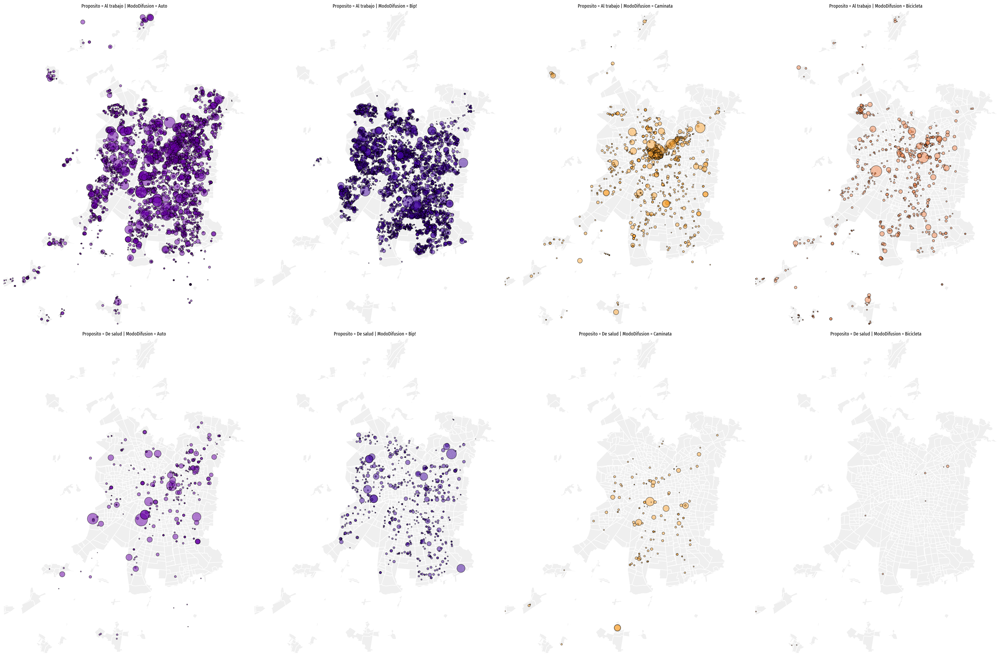

In [33]:
grid = GeoFacetGrid(
    origenes_viajes,
    context=zones,
    row="Proposito",
    col="ModoDifusion",
    row_order=["Al trabajo", "De salud"],
    col_order=["Auto", "Bip!", "Caminata", "Bicicleta"],
    height=9,
    hue="ModoDifusion",
    palette="plasma",
)

grid.add_layer(zones, color="#efefef", edgecolor="white", linewidth=1)
grid.add_layer(bubble_map, size="PesoLaboral", scale=0.15, edgecolor="black", alpha=0.5)


¡Mucho mejor! Sin embargo, la sobreposición de las burbujas sigue siendo un problema. No logramos ver la distribución debido a la oclusión de los puntos.

La solución es usar un `heat_map`. Así se ve un heatmap sobre todos los viajes al trabajo. Solo debemos reemplazar el uso de `bubble_map` por `heat_map` (y usar los parámetros correspondientes):

En general para hacer un mapa de calor, necesitamos estimar una KDE en dos dimensiones, y así tener áreas de densidad que permiten ver la distribución de los datos.

En estadística, kernel density estimation (KDE), es un método no paramétrico que permite estimar la función de densidad de probabilidad de una variable aleatoria a partir de un número finito de observaciones (muestra). Fué propuesto por Fix y Hodges (1951) y Rosenblatt (1956).